# Trabajo de final de máster de Big Data & Data Science de la Universidad de Barcelona

- Entrega: 4
- Fecha: 11/02/2022
- Autores: Mario Mérida, Jesus García Solsana, Eduerdo Farías Pedreros

---
# Identificar y localizar anomalías de COVID-19 en radiografías de tórax de la competencia de kaggle "[SIIM-FISABIO-RSNA COVID-19 Detection](https://www.kaggle.com/c/siim-covid19-detection)".

Cinco veces más letal que la gripe, el COVID-19 causa una morbilidad y mortalidad significativas. Al igual que otras neumonías, la infección pulmonar por COVID-19 produce inflamación y líquido en los pulmones. El COVID-19 se parece mucho a otras neumonías virales y bacterianas en las radiografías de tórax, lo que dificulta su diagnóstico. Su modelo de visión artificial para detectar y localizar la COVID-19 ayudaría a los médicos a proporcionar un diagnóstico rápido y fiable. Como resultado, los pacientes podrían recibir el tratamiento adecuado antes de que se produzcan los efectos más graves del virus.

Actualmente, COVID-19 se puede diagnosticar mediante la reacción en cadena de la polimerasa para detectar material genético del virus o una radiografía de tórax. Sin embargo, pueden pasar algunas horas y, a veces, días antes de que se obtengan los resultados de las pruebas moleculares. Por el contrario, las radiografías de tórax se pueden obtener en minutos. Si bien existen pautas para ayudar a los radiólogos a diferenciar el COVID-19 de otros tipos de infección, sus evaluaciones varían. Además, los no radiólogos podrían recibir apoyo con una mejor localización de la enfermedad, como con un cuadro delimitador visual.

Como organización de atención médica líder en su campo, la misión de la Society for Imaging Informatics in Medicine (SIIM) es promover la informática de imágenes médicas a través de la educación, la investigación y la innovación. SIIM se ha asociado con la Fundación para el Fomento de la Investigación Sanitaria y Biomédica de la Comunidad Valenciana (FISABIO), el Banco de Datos de Imagen Médica de la Comunidad Valenciana (BIMCV) y la Sociedad Radiológica de Norteamérica (RSNA) para este concurso.

En esta competencia, identificará y localizará anomalías de COVID-19 en radiografías de tórax. En particular, clasificará las radiografías como negativas para neumonía o típicas, indeterminadas o atípicas para COVID-19. Usted y su modelo trabajarán con datos de imágenes y anotaciones de un grupo de radiólogos.

Si tiene éxito, ayudará a los radiólogos a diagnosticar a los millones de pacientes con COVID-19 con mayor confianza y rapidez. Esto también permitirá a los médicos ver el alcance de la enfermedad y ayudarlos a tomar decisiones sobre el tratamiento. Dependiendo de la gravedad, los pacientes afectados pueden necesitar hospitalización, ingreso en una unidad de cuidados intensivos o terapias de apoyo como ventilación mecánica. Como resultado de un mejor diagnóstico, más pacientes recibirán rápidamente la mejor atención para su condición, lo que podría mitigar los efectos más severos del virus.

Esta es una competencia de código. Consulte [Requisitos del código](https://www.kaggle.com/c/siim-covid19-detection/overview/code-requirements) para obtener más información.

### Organizaciones anfitrionas

**FISABIO, Fundación para el Fomento de la Salud y la Investigación Biomédica de la Comunidad Valenciana**

La Fundación para el Fomento de la Investigación Biomédica y Sanitaria de la Comunitat Valenciana, FISABIO, es una entidad científica y asistencial sin ánimo de lucro, que tiene como finalidad principal el fomento, la promoción y el desarrollo de la investigación científico-técnica biomédica y sanitaria en la Comunitat Valenciana. FISABIO integra y gestiona el Mapa de Investigación Sanitaria del Centro de Investigación en Salud Pública, Fundación Hospital Universitario Dr. Peset, Fundación Hospital General Universitario de Alicante, Fundación Hospital General Universitario de Elche y Fundación Oftalmológica del Mediterráneo. La instalación de BIMCV está conectada con un archivo neutral de proveedores (VNA) de varios niveles. La instalación de imagen de población almacena datos de la Comunidad Valenciana, que cuenta con más de 5,1 millones de habitantes.

**Sociedad Radiológica de América del Norte (RSNA)**

La Sociedad Radiológica de América del Norte (RSNA) es una organización sin fines de lucro que representa a 31 subespecialidades radiológicas de 145 países de todo el mundo. RSNA promueve la excelencia en la atención al paciente y la prestación de atención médica a través de la educación, la investigación y la innovación tecnológica.

RSNA proporciona recursos educativos de alta calidad, publica cinco de las principales revistas revisadas por pares, organiza la conferencia de radiología más grande del mundo y se dedica a construir el futuro de la profesión a través de la Fundación RSNA Research & Education (R&E), que ha financiado $66 millones en subvenciones. desde su concepción. RSNA también apoya y facilita la investigación de inteligencia artificial (IA) en imágenes médicas mediante el patrocinio de una serie continua de concursos de desafíos de IA.

---
# Carga de librerias

In [94]:
# para preparacion de datos
import numpy as np
import pandas as pd

# para trabajar con archivos en explorador
import os

# para cargar metadatos de archivos dicom 
import csv

# para procesamiento de imagenes
import pydicom as dicom
import cv2
from PIL import Image
from skimage.metrics import structural_similarity as ssim
from imgaug import augmenters as iaa 
import imageio
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

# para gráficos
import matplotlib.pylab as plt

# para division train_test_split
from sklearn.model_selection import train_test_split

# para modelado
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array, array_to_img # para convertir imagenes en matrices
from keras_preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model # para realizar modelop en base a dataframe
from keras.layers import Activation, Dropout, Flatten, Dense, BatchNormalization, Conv2D, MaxPooling2D  # para layers de modelo
from tensorflow.keras import regularizers, optimizers

# para evaluación de modelado
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay, classification_report

---
# Análisis exploratorio


## Análisis de imágenes

### Exploración de imagen `dicom`

In [2]:
def show_dcm_file(return_file_meta,dir):
    
    """Función para ver imágen DCM y sus principales características.
    - return_file_meta: opción para que la función regrese la imagen y almacenarla en una variable.
    - dir: directorio de imagen/imágenes DCM a mostrar.""" 
    
    # lista auxiliar
    dcm_file_name = []
    dcm_list = []
    dcm_list_full_dir = []
    
    # obtenemos nombre de archivos y ruta
    for root, directories, files in os.walk(dir, topdown=False):
        for name in files:
            dcm_dir = os.path.join(root)
            dcm_file_name = os.path.join(name)

            # ruta completa a imagen DCM a mostrar
            dcm_full_dir = os.path.join(dcm_dir, dcm_file_name)

            # cargamos la imagen
            dcm = dicom.dcmread(dcm_full_dir)

            # muestra de resultados
            if return_file_meta == True:
                dcm_list_full_dir.append(dcm_full_dir)
                dcm_list.append(dicom.dcmread(dcm_full_dir))
            else:
                print('Ruta de imagen/imágenes:', dcm_dir)
                print('ID estudio:', dcm_file_name)
                print("Tipo de imagen:", type(dcm))
                print("Dimensiones de matrix de imagen:", img_to_array(dcm.pixel_array).shape)
                print('Sexo del paciente:', dcm[0x0010, 0x0040][:])
                plt.figure(figsize=(16,8))
                plt.imshow(dcm.pixel_array)
                plt.show()
                print('---------------------------------------------------------------')
                
    if not dcm_list == []:
        return dcm_list_full_dir, dcm_list

Ruta de imagen/imágenes: ./data/train/00f9e183938e/081e92373dc6
ID estudio: 6534a837497d.dcm
Tipo de imagen: <class 'pydicom.dataset.FileDataset'>
Dimensiones de matrix de imagen: (2544, 3056, 1)
Sexo del paciente: F


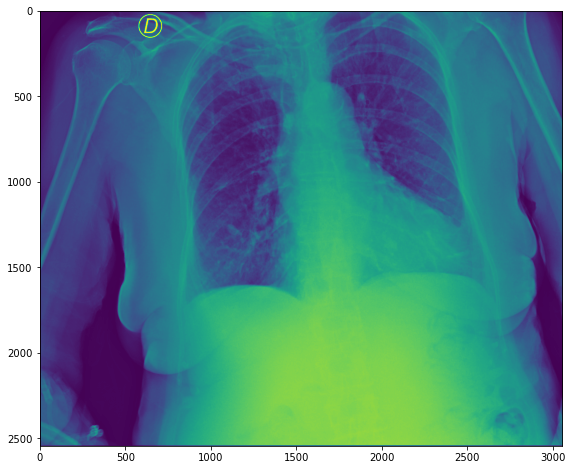

---------------------------------------------------------------
Ruta de imagen/imágenes: ./data/train/00f9e183938e/89bad86310f9
ID estudio: 74077a8e3b7c.dcm
Tipo de imagen: <class 'pydicom.dataset.FileDataset'>
Dimensiones de matrix de imagen: (2544, 3056, 1)
Sexo del paciente: F


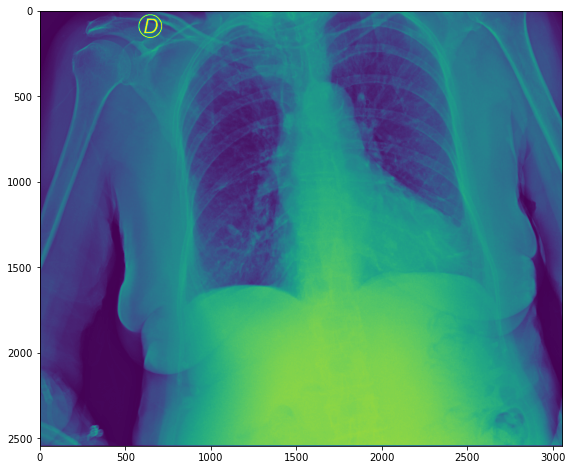

---------------------------------------------------------------


In [3]:
# mostramos imagen/imágenes DCM
show_dcm_file(return_file_meta=False,
                dir = './data/train/00f9e183938e/')

In [4]:
# ejemplo para obtener un metadato específico de imagen DCM
show_dcm_file(return_file_meta=True,
                dir = './data/train/00f9e183938e/')[1][0][0x7fe0, 0x0010]

(7fe0, 0010) Pixel Data                          OW: Array of 15548928 elements

### Conversion de `dcm` a `jpg`

In [5]:
def conv_dcm_to_jpg(input_dir,
                    output_dir = './data/examples/train_jpg/',
                    return_jpg = True):

    """Función para ver convertir archivos DCM de un directorio (inc. subdirectorios) a JPG.
    - input_dir: directorio de archivos DCM a covertir.
    - output_dir: directorio de archivos JPG.
    - return_jpg: opción para que la función regrese la imagen y almacenarla en una variable.""" 
    
    # lista de archivos DCM en el directorio input
    dcm_list = show_dcm_file(return_file_meta = True,
                                    dir = input_dir)[1]
    
    for dcm in dcm_list:
        # matriz de pixeles de imagen DCM
        dcm_pixel_array_numpy = dcm.pixel_array
        
        # normalizado de escala de imagen (de int16 a uint8)
        scaled_img = cv2.convertScaleAbs(dcm_pixel_array_numpy-np.min(dcm_pixel_array_numpy), alpha=(255.0 / min(np.max(dcm_pixel_array_numpy)-np.min(dcm_pixel_array_numpy), 10000)))

        # definimos ubicacion de archivo JPG y creamos carpeta si no existe
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        # remplazo extenision DCM a JPG
        jpg_file_name = dcm[0x0008, 0x0018][:]+'.jpg'

        # direccion completa a imagen JPG a convertir
        jpg_full_dir = os.path.join(output_dir, jpg_file_name)

        # creamos archivo JPG en directorio dado
        result = cv2.imwrite(jpg_full_dir, scaled_img)

        # mostramos resultados    
        if result == True:
            jpg = load_img(jpg_full_dir)
            if return_jpg == True:    
                print('Imagen convertida correctamente.')
                print('Ruta de imagen/imágenes DCM:', input_dir)
                print('Ruta de imagen/imágenes JPG:', output_dir)
                print('ID estudio:', jpg_file_name)
                print("Tipo de imagen:", type(jpg))
                print("Modo de imagen:", jpg.mode)
                print("Tamaño de imagen:", jpg.size)
                print("Dimensiones de matrix de imagen:", img_to_array(jpg).shape)
                plt.figure(figsize=(16,8))
                plt.imshow(jpg)
                plt.show()
                print('---------------------------------------------------------------')
        else:
            print('Error in saving file')

Imagen convertida correctamente.
Ruta de imagen/imágenes DCM: ./data/train/00f9e183938e/
Ruta de imagen/imágenes JPG: ./data/examples/train_jpg/
ID estudio: 6534a837497d.jpg
Tipo de imagen: <class 'PIL.Image.Image'>
Modo de imagen: RGB
Tamaño de imagen: (3056, 2544)
Dimensiones de matrix de imagen: (2544, 3056, 3)


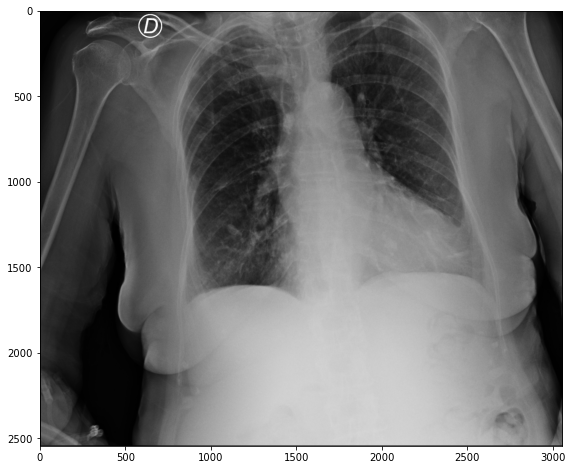

---------------------------------------------------------------
Imagen convertida correctamente.
Ruta de imagen/imágenes DCM: ./data/train/00f9e183938e/
Ruta de imagen/imágenes JPG: ./data/examples/train_jpg/
ID estudio: 74077a8e3b7c.jpg
Tipo de imagen: <class 'PIL.Image.Image'>
Modo de imagen: RGB
Tamaño de imagen: (3056, 2544)
Dimensiones de matrix de imagen: (2544, 3056, 3)


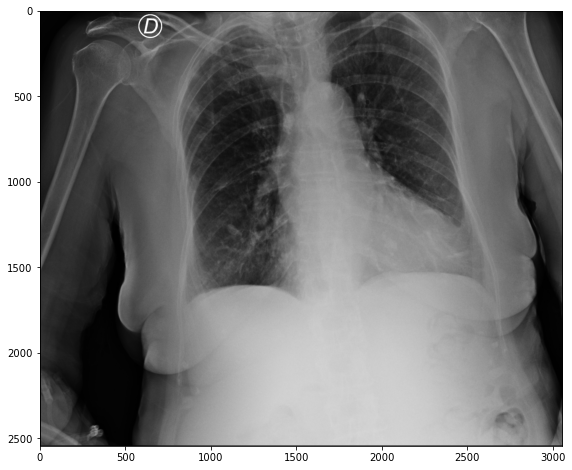

---------------------------------------------------------------


In [6]:
# conversión de imagen/imágenes DCM a JPG
conv_dcm_to_jpg(input_dir = './data/train/00f9e183938e/',
                output_dir = './data/examples/train_jpg/',
                return_jpg=True)

In [7]:
# conversión de imagen/imágenes DCM a JPG
conv_dcm_to_jpg(input_dir = './data/train/00086460a852/',
                output_dir = './data/examples/train_jpg/',
                return_jpg=False)

### Transformación de imagen `jpg` a escala de grises y tamaño reducido

In [8]:
def reduce_jpg(dir,
                jpg_file_name,
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = True):
    
    """Función para ver reducir tamaño de imagen JPG y convertir a escala de grises.
    - dir: directorio de imagen original a reducir.
    - jpg_file_name: nombre de archivo JPG original a reducir.
    - output_basewidth: ancho de la imagen reducida en pixeles.
    - output_subfix: subfijo para identificar jpg reducido.
    - return_jpg_red: retorna imagen reducida.""" 

    # definimos la ruta completa de imagen original
    jpg_full_dir = dir+jpg_file_name

    #abrimos la imagen oringial y la pasamos a escala de grises
    jpg = Image.open(jpg_full_dir).convert('RGB')    
    jpg_red = Image.open(jpg_full_dir).convert('L')

    # calculamos relacion entre imagen original y nueva imagen
    wpercent = (output_basewidth / float(jpg.size[0]))

    #ajustamos el alto de la imagen
    hsize = int((float(jpg.size[1]) * float(wpercent)))

    # cambiamos el tamaño de la imagen en base al ancho dado y alto calculado
    jpg_red = jpg_red.resize((output_basewidth, hsize), Image.ANTIALIAS)

    # agergamos subfijo para identificar reduccion de calidad
    jpg_red_full_dir = jpg_full_dir.replace('.jpg', output_subfix+'.jpg')

    # guardamos la imagen
    jpg_red.save(jpg_red_full_dir)

    # mostramos resultados
    print('Imagen reducida correctamente.')
    if return_jpg_red == True:  
        print('Ruta de imagen/imágenes original:', jpg_full_dir)
        print('Ruta de imagen/imágenes reducida:', jpg_red_full_dir)
        print('ID estudio original:', jpg_file_name)
        print("Tipo de imagen original:", type(jpg))
        print("Tipo de imagen reducida:", type(jpg_red))
        print("Modo de imagen original:", jpg.mode)
        print("Modo de imagen reducida:", jpg_red.mode)
        print("Tamaño de imagen original:", jpg.size)
        print("Tamaño de imagen reducida:", jpg_red.size)
        print("Dimensiones de matrix de imagen original:", img_to_array(jpg).shape)
        print("Dimensiones de matrix de imagen reducida:", img_to_array(jpg_red).shape)
        plt.figure(figsize=(16,8))
        plt.imshow(jpg_red, cmap='gray')
        plt.show()
        print('---------------------------------------------------------------')

Imagen reducida correctamente.
Ruta de imagen/imágenes original: ./data/examples/train_jpg/6534a837497d.jpg
Ruta de imagen/imágenes reducida: ./data/examples/train_jpg/6534a837497d_red.jpg
ID estudio original: 6534a837497d.jpg
Tipo de imagen original: <class 'PIL.Image.Image'>
Tipo de imagen reducida: <class 'PIL.Image.Image'>
Modo de imagen original: RGB
Modo de imagen reducida: L
Tamaño de imagen original: (3056, 2544)
Tamaño de imagen reducida: (450, 374)
Dimensiones de matrix de imagen original: (2544, 3056, 3)
Dimensiones de matrix de imagen reducida: (374, 450, 1)


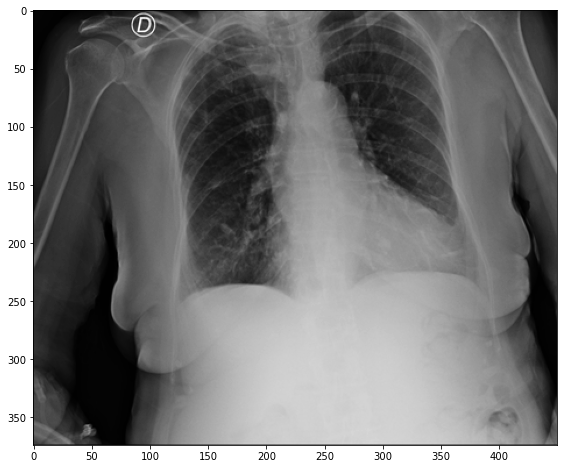

---------------------------------------------------------------


In [9]:
# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = './data/examples/train_jpg/',
                jpg_file_name = '6534a837497d.jpg',
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = True)

In [10]:
# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = './data/examples/train_jpg/',
                jpg_file_name = '65761e66de9f.jpg',
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = False)

Imagen reducida correctamente.


In [11]:
# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = './data/examples/train_jpg/',
                jpg_file_name = '74077a8e3b7c.jpg',
                output_basewidth = 450,
                output_subfix = '_red',
                return_jpg_red = False)

Imagen reducida correctamente.


### Conclusion de imágenes

Por medio de la librería `pydicom`, las imágenes pueden leerse directamente como fueron obtenidas de la fuente en formato `DCM` en Python. Sin embargo la resolución de las imágenes y la gama de colores pueden tener un coste computacional considerable al momento de analizar grandes volúmenes de datos.

Se deberá entonces convertir el formato de la imágen a un formato más simple de interpretar, como por ejemplo en `JPG`, donde se observa que la gama de colores se reduce naturalmente a escala de grises. Esto tiene sentido ya que las radiografías suelen estar en una gama de colores entre azul y negro. También analizamos la posibilidad de escalar la imágen para reducir el coste computacional a expensas de la precisión de un modelo.

---
## Análisis de dataframes

### Dataframe `train_study_level.csv`

In [12]:
# directorio de datos de entrenamiento
train_dir = "./data/train/"

# cargamos datos de estudio
df_train_study = pd.read_csv('./train_study_level.csv')

# limpiamos datos a relacionar
df_train_study['study_dir'] = df_train_study['id'].str.replace('_study','')

# quitamos columnas redundantes
df_train_study = df_train_study.drop(columns = ['id'])

# muestra resultados
df_train_study[:10]

,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,study_dir
0,0,1,0,0,00086460a852
1,0,0,0,1,000c9c05fd14
2,1,0,0,0,00292f8c37bd
3,1,0,0,0,005057b3f880
4,0,0,0,1,0051d9b12e72
5,1,0,0,0,00792b5c8852
6,1,0,0,0,00908ffd2d08
7,0,0,1,0,009bc005edaa
8,0,0,1,0,00a76543ed93
9,0,1,0,0,00a87235ca36


### Dataframe `train_image_level.csv`

In [13]:
# cargamos datos de imagenes
df_train_image = pd.read_csv('./train_image_level.csv')

#limpiamos los datos
df_train_image["image_name"] = df_train_image["id"].str.replace('_image', '')

#quitamos datos redundantes
df_train_image = df_train_image.drop(columns = {'id'})

# muestra resultados
df_train_image[:10]

,boxes,label,StudyInstanceUID,image_name
0,"[{'x': 789.28836, 'y': 582.43035, 'width': 102...",opacity 1 789.28836 582.43035 1815.94498 2499....,5776db0cec75,000a312787f2
1,NaN,none 1 0 0 1 1,ff0879eb20ed,000c3a3f293f
2,"[{'x': 677.42216, 'y': 197.97662, 'width': 867...",opacity 1 677.42216 197.97662 1545.21983 1197....,9d514ce429a7,0012ff7358bc
3,"[{'x': 2729, 'y': 2181.33331, 'width': 948.000...",opacity 1 2729 2181.33331 3677.00012 2785.33331,28dddc8559b2,001398f4ff4f
4,"[{'x': 623.23328, 'y': 1050, 'width': 714, 'he...",opacity 1 623.23328 1050 1337.23328 2156 opaci...,dfd9fdd85a3e,001bd15d1891
5,"[{'x': 1857.2065, 'y': 508.30565, 'width': 376...",opacity 1 1857.2065 508.30565 2233.23384 907.8...,84543edc24c2,0022227f5adf
6,NaN,none 1 0 0 1 1,2fa400b873f5,0023f02ae886
7,"[{'x': 276.72917, 'y': 627.42968, 'width': 910...",opacity 1 276.72917 627.42968 1187.31776 2283....,0717c8ac304f,002e9b2128d0
8,"[{'x': 542.96057, 'y': 364.37257, 'width': 590...",opacity 1 542.96057 364.37257 1133.32317999999...,a81050391441,00326161e51e
9,"[{'x': 1703.78756, 'y': 938.29333, 'width': 91...",opacity 1 1703.78756 938.29333 2614.8275599999...,b60f2d2cc642,0044e449aae1


### Dataframe de contentido en `carpeta train`

In [14]:
# creacion de lista auxiliar
train_walk_list = []

# carga de datos de carpetas, subcarpetas y archivos de un dado directorio
for root, directories, files in os.walk(train_dir, topdown=False):
	for name in files:
		train_walk_list.append(os.path.join(root, name))

# creacion de un dataframe con los datos obtenidos
df_train = pd.DataFrame(train_walk_list)

# separacion de datos en columnas
df_train[0] = df_train[0].str.replace('\\', '/', regex=True)
df_train[['data','root','train_dir', 'study_dir','study_subdir', 'image_name']] = df_train[0].str.split('/', expand=True)
df_train[['image_name', 'ext']] = df_train['image_name'].str.split('.',expand=True)
df_train['full_dir'] = df_train[0]

# quitamos columnas redundantes
df_train = df_train.drop(columns = [0, 'data', 'root', 'train_dir', 'ext'])

# mostrar resultados
df_train[:10]

,study_dir,study_subdir,image_name,full_dir
0,00086460a852,9e8302230c91,65761e66de9f,./data/train/00086460a852/9e8302230c91/65761e6...
1,000c9c05fd14,e555410bd2cd,51759b5579bc,./data/train/000c9c05fd14/e555410bd2cd/51759b5...
2,00292f8c37bd,73120b4a13cb,f6293b1c49e2,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...
3,005057b3f880,e34afce999c5,3019399c31f4,./data/train/005057b3f880/e34afce999c5/3019399...
4,0051d9b12e72,152f6ec68d86,bb4b1da810f3,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...
5,00792b5c8852,1f52bcb3143e,3fadf4b48db3,./data/train/00792b5c8852/1f52bcb3143e/3fadf4b...
6,00908ffd2d08,e1bb4145673c,bf1f75117093,./data/train/00908ffd2d08/e1bb4145673c/bf1f751...
7,009bc005edaa,8713301456d4,1df3e98f79be,./data/train/009bc005edaa/8713301456d4/1df3e98...
8,00a76543ed93,4a223cccbe04,ad8d4a5ba8f0,./data/train/00a76543ed93/4a223cccbe04/ad8d4a5...
9,00a87235ca36,b7a93187765f,09cf9767a7bf,./data/train/00a87235ca36/b7a93187765f/09cf976...


### Union de dataframe de `carpeta train` con `train_study_level.csv` y `train_image_level.csv`.

In [15]:
# union con train_study
df_train = df_train.merge(right = df_train_study, how = 'left')

# union con train_image
df_train = df_train.merge(right = df_train_image, how = 'left')

# muestra de resultados
df_train[:10]

,study_dir,study_subdir,image_name,full_dir,Negative for Pneumonia,Typical Appearance,Indeterminate Appearance,Atypical Appearance,boxes,label,StudyInstanceUID
0,00086460a852,9e8302230c91,65761e66de9f,./data/train/00086460a852/9e8302230c91/65761e6...,0,1,0,0,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852
1,000c9c05fd14,e555410bd2cd,51759b5579bc,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,0,0,0,1,NaN,none 1 0 0 1 1,000c9c05fd14
2,00292f8c37bd,73120b4a13cb,f6293b1c49e2,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,1,0,0,0,NaN,none 1 0 0 1 1,00292f8c37bd
3,005057b3f880,e34afce999c5,3019399c31f4,./data/train/005057b3f880/e34afce999c5/3019399...,1,0,0,0,NaN,none 1 0 0 1 1,005057b3f880
4,0051d9b12e72,152f6ec68d86,bb4b1da810f3,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,0,0,0,1,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72
5,00792b5c8852,1f52bcb3143e,3fadf4b48db3,./data/train/00792b5c8852/1f52bcb3143e/3fadf4b...,1,0,0,0,NaN,none 1 0 0 1 1,00792b5c8852
6,00908ffd2d08,e1bb4145673c,bf1f75117093,./data/train/00908ffd2d08/e1bb4145673c/bf1f751...,1,0,0,0,NaN,none 1 0 0 1 1,00908ffd2d08
7,009bc005edaa,8713301456d4,1df3e98f79be,./data/train/009bc005edaa/8713301456d4/1df3e98...,0,0,1,0,"[{'x': 666.21393, 'y': 1160.51975, 'width': 10...",opacity 1 666.21393 1160.51975 1697.12842 1902...,009bc005edaa
8,00a76543ed93,4a223cccbe04,ad8d4a5ba8f0,./data/train/00a76543ed93/4a223cccbe04/ad8d4a5...,0,0,1,0,"[{'x': 639.68044, 'y': 0, 'width': 902.77729, ...",opacity 1 639.68044 0 1542.45773 1840.64232,00a76543ed93
9,00a87235ca36,b7a93187765f,09cf9767a7bf,./data/train/00a87235ca36/b7a93187765f/09cf976...,0,1,0,0,"[{'x': 1475.11186, 'y': 433.57768, 'width': 49...",opacity 1 1475.11186 433.57768 1975.08403 1314...,00a87235ca36


### Clases de diagnostico

In [16]:
def label_diag(row):
   
   """Funcion para clasificar las columnas de diagnóstico en una sóla columna (datos de formato wide a long)."""
   
   if row['Negative for Pneumonia'] == 1 :
      return 'neg_for_pneumonia'
   if row['Typical Appearance'] == 1 :
      return 'typical'
   if row['Indeterminate Appearance'] == 1 :
      return 'indeterminate'
   if row['Atypical Appearance'] == 1 :
      return 'atypical'
   return 'Other'

In [17]:
# pasamos datos wide a long
df_train['diagnostic_cat'] = df_train.apply (lambda row: label_diag(row), axis=1)

#quitamos datos redundantes
df_train = df_train.drop(columns=['study_subdir', 'Negative for Pneumonia', 'Typical Appearance', 'Indeterminate Appearance', 'Atypical Appearance'])

# mostramos resultados
df_train[:5]

,study_dir,image_name,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat
0,00086460a852,65761e66de9f,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical
1,000c9c05fd14,51759b5579bc,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical
2,00292f8c37bd,f6293b1c49e2,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia
3,005057b3f880,3019399c31f4,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia
4,0051d9b12e72,bb4b1da810f3,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical


In [18]:
# frecuencias absolutas de diagnósticos
df_train[['diagnostic_cat']].value_counts(normalize=True).round(3) * 100

diagnostic_cat   
typical              47.5
neg_for_pneumonia    27.4
indeterminate        17.5
atypical              7.6
dtype: float64

In [19]:
# resumen información del fichero
df_train.drop(columns=['full_dir']).describe(include='all')

,study_dir,image_name,boxes,label,StudyInstanceUID,diagnostic_cat
count,6334,6334,4294,6334,6334,6334
unique,6054,6334,4294,4295,6054,4
top,0fd2db233deb,65761e66de9f,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",none 1 0 0 1 1,0fd2db233deb,typical
freq,9,1,1,2040,9,3007


### Conclusion de dataframes

Al analizar los datos dados en los `CSV` y al compararlos con todos los archivos y subcarpetas dentro de la carpeta `train` se observa que hay carpetas `study_dir` que se repiten (`unique` es menor a `count`). Es decir que hay pacientes (`study_dir`) que tienen más de 1 estudio/radiografía (`image_name_jpg`).

Los estudios (`image_name_jpg`) tienen todos nombres distintos pero quizás hayan datos duplicados o en blanco. Esto solo se puede corroborar visualizando la imágen.

La cantidad de datos están distribuidos de la forma esperada no equitativa que es: mayor cantidad de estudios/radiografías con diagnóstico `típico`, luego casos `negativos para neumonía`, en tercer lugar casos `indeterminados` y finalmente, en menor proporción, casos `atípicos`.

---
## Análisis simultaneo de imágenes y dataframes

### Parseo de `boxes`(lista de diccionarios) y `labels`(str) a `dataframe`

In [20]:
def append_ext(fn):
    
    """Función para agregar extension JPG a los valores en una columna de un dataframe."""
    
    return fn+".jpg"

In [21]:
# agregamos extension en image_name
df_train["image_name_jpg"]=df_train['image_name'].apply(append_ext)

#quitamos datos redundantes
df_train = df_train.drop(columns=['image_name'])

# mostramos resultados
df_train[:5]

,study_dir,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat,image_name_jpg
0,00086460a852,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical,65761e66de9f.jpg
1,000c9c05fd14,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical,51759b5579bc.jpg
2,00292f8c37bd,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia,f6293b1c49e2.jpg
3,005057b3f880,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia,3019399c31f4.jpg
4,0051d9b12e72,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical,bb4b1da810f3.jpg


In [22]:
def vis_diag_box(jpg_file):
    
    """Función para parsear y visualizar diagnósticos de un estudio en un dataframe.

    Args:
        jpg_file: es el ID del estudio con extensión en JPG.

    Returns:
        dataframe: dataframe de boxes con diagnósticos.
    """
    
    # copiamos los datos del estudio a un dataframe
    df_boxes = pd.DataFrame(df_train.loc[df_train['image_name_jpg'] == jpg_file, 'boxes':'label'].copy())
    
    # parseo de datos str a diccionario
    if "none" in str(df_boxes['label']):
        df_boxes['image_name_jpg'] = jpg_file
        df_boxes = df_boxes.reset_index(drop = True)
        df_boxes['box'] = pd.NA
        df_boxes['label_diagnostic'] = 'none'
        df_boxes['label_diagnostic_code'] = '1 0 0 1 1'
        df_boxes.drop(columns = ['boxes', 'label'], inplace = True)
        return df_boxes
    else:
        df_boxes['boxes'] = df_boxes['boxes'].apply(eval)
        # transformacion de las listas a filas en el dataframe
        df_boxes = df_boxes.explode('boxes').reset_index(drop = True)
        # creamos columnas para almacenar datos
        df_boxes['image_name_jpg'] = jpg_file
        df_boxes['box'] = None
        df_boxes['x'] = None
        df_boxes['y'] = None
        df_boxes['width'] = None
        df_boxes['height'] = None
        df_boxes['label_diagnostic'] = None
        df_boxes['label_diagnostic_code'] = None
        # copiamos datos de estudio a nuevas columnas
        for i in range(len(df_boxes)):
            df_boxes.loc[i, 'box'] = i
            df_boxes.loc[i, 'x'] = df_boxes.loc[i, 'boxes']['x']
            df_boxes.loc[i, 'y'] = df_boxes.loc[i, 'boxes']['y']
            df_boxes.loc[i, 'width'] = df_boxes.loc[i, 'boxes']['width']
            df_boxes.loc[i, 'height'] = df_boxes.loc[i, 'boxes']['height']
            df_boxes.loc[i, 'label_diagnostic'] = pd.Series(df_boxes.loc[0, 'label']).str.split(' ', 0, expand=True).loc()[0,i+5*i]
            df_boxes.loc[i, 'label_diagnostic_code'] = pd.Series(df_boxes.loc[0, 'label']).str.split(' ', 0, expand=True).loc()[0,i+1+5*i]
        # quitamos columnas no necesarias
        df_boxes.drop(columns = ['boxes', 'label'], inplace = True)
        # transformamos las columnas a numerico
        for column in df_boxes:
            if column != 'image_name_jpg' and column != 'label_diagnostic': 
                df_boxes[column] = df_boxes[column].astype(float)
        # muestra resultados
        return df_boxes

In [23]:
# mostramos diagnósticos por recuadro de un estudio específico
vis_diag_box(jpg_file = '65761e66de9f.jpg')

,image_name_jpg,box,x,y,width,height,label_diagnostic,label_diagnostic_code
0,65761e66de9f.jpg,0.0,720.65215,636.51048,332.19348,648.12561,opacity,1.0
1,65761e66de9f.jpg,1.0,2044.77989,847.90622,329.87049,576.11169,opacity,1.0


In [24]:
# mostramos diagnósticos por recuadro de un estudio específico
vis_diag_box(jpg_file = '6534a837497d.jpg')

,image_name_jpg,box,label_diagnostic,label_diagnostic_code
0,6534a837497d.jpg,<NA>,none,1 0 0 1 1


In [25]:
# mostramos diagnósticos por recuadro de un estudio específico
vis_diag_box(jpg_file = '74077a8e3b7c.jpg')

,image_name_jpg,box,x,y,width,height,label_diagnostic,label_diagnostic_code
0,74077a8e3b7c.jpg,0.0,2175.24285,1123.72368,432.26318,500.11853,opacity,1.0
1,74077a8e3b7c.jpg,1.0,823.16390,1324.77631,306.60522,394.56580,opacity,1.0
2,74077a8e3b7c.jpg,2.0,845.78232,291.86842,201.05261,437.28949,opacity,1.0


### Abrir imagen `jpg` en escala de grises y reducida con diagnostico en recuadro

In [26]:
# creamos la función
def open_jpgs(jpg_file_name,
                red_jpg_file_name,
                dir = './data/examples/train_jpg/'):
    
    """Función para abrir 2 rutas e imágenes JPGs (original y reducida respectivamente).
    - jpg_file_name: nombre de imagen de estudio original.
    - red_jpg_file_name: nombre de imagen de estudio reducida.
    - dir: directorio con ubicación de archivos JPG original y reducio a abrir."""

    # definimos la ruta completa de imágen original y reducida
    jpg_full_dir = dir+jpg_file_name    
    red_jpg_full_dir = dir+red_jpg_file_name

    #abrimos la imagen oringial y la pasamos a escala de grises
    jpg = Image.open(jpg_full_dir).convert('RGB')   
    jpg_red = Image.open(red_jpg_full_dir).convert('L')

    return jpg_full_dir, jpg, red_jpg_full_dir, jpg_red


In [27]:
def vis_diag_jpg(file_name,
                    scale,
                    red_subfix = '_red',
                    dir = './data/examples/train_jpg/'):
    
    """Función para visualizar imagen con recuadros con diagnóstico en imágen JPG reducida.
    - file_name: nombre de archivo JPG al que se le agregarán los recuadros con diagnósticos.
    - scale: porcentaje de escalado entre imagen reducida sobre imagen original.
    - dir: directorio donde se encuentra el archivo JPG.""" 
    
    # verificamos nombre de archivo JPG original o reducido
    if red_subfix not in file_name:
        original = True
        jpg_file_name = file_name
        red_jpg_file_name = file_name.replace('.jpg', red_subfix+'.jpg')
    
    else:
        original = False
        jpg_file_name = file_name.replace(red_subfix,'')
        red_jpg_file_name = file_name
        
    # creación ded dataframe de boxes
    df_boxes = vis_diag_box(jpg_file_name)
    
    if df_boxes['label_diagnostic'][0] == 'none':
        print('Ruta de imagen:', dir)
        print('ID estudio:', file_name)
        print('Este estudio no tiene recuadros de diagnóstico.')
        plt.figure(figsize=(16,8))
        plt.imshow(Image.open(dir+file_name).convert('L'), cmap='gray')
        plt.show()
        print('---------------------------------------------------------------')
        return
    else:
        
        # bucle para cargar todos los recuadros    
        for box in range(len(df_boxes)):

            if original == True:
                # cargamos la imagen original
                img = cv2.imread(dir+jpg_file_name)
                scale = 1
                thickness = 3

            else:
                # cargamos la imagen REDUCIDA
                img = cv2.imread(dir+red_jpg_file_name)
                thickness = 1
            
            # cargamos las coordenadas de la esquina SUPERIOR IZQUIERDA del recuadro
            x1 = int(df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'x'][box] * scale)
            y1 = int(df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'y'][box] * scale)
            
            # cargamos dimensiones del recuadro
            w = int((df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'width'][box]) * scale)
            h = int((df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'height'][box]) * scale)
            
            # dibujamos un rectangulo
            img = cv2.rectangle(img = img, pt1 = (x1, y1), pt2 = (x1+w, y1+h), color = (0, 0, 255), thickness = thickness)
            print(f"Box {box}: x, y, w, h: {x1}, {y1}, {w}, {h}")
            
            # texto a incluir
            font                   = cv2.FONT_HERSHEY_SIMPLEX
            fontColor              = (0,0,255)
            if original == True:
                bottomLeftCornerOfText = (x1,y1-50)
                fontScale              = 3
                lineType               = 3
            else:
                bottomLeftCornerOfText = (x1,y1-10)
                fontScale              = 0.6
                lineType               = 1
            img_text = df_boxes.loc[df_boxes["image_name_jpg"] == jpg_file_name, 'label_diagnostic'][box]
            cv2.putText(img, img_text, bottomLeftCornerOfText, font, fontScale, fontColor, lineType)

            # guardamos la imagen
            if original == True:
                img_dir = dir+jpg_file_name
            else:
                img_dir = dir+red_jpg_file_name
        
            # guardamos la imagen
            cv2.imwrite(img_dir, img)
        
        # mostramos la imagen jpg
        print('Tamaño de imagen:', img.shape)
        if original == True:
            print("JPG original modificado.")
        else:
            print("JPG reducido modificado.")
        print('Ruta de imagen:', dir)
        print('ID estudio:', file_name)
        return load_img(dir+file_name)

Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 6534a837497d_red.jpg
Este estudio no tiene recuadros de diagnóstico.


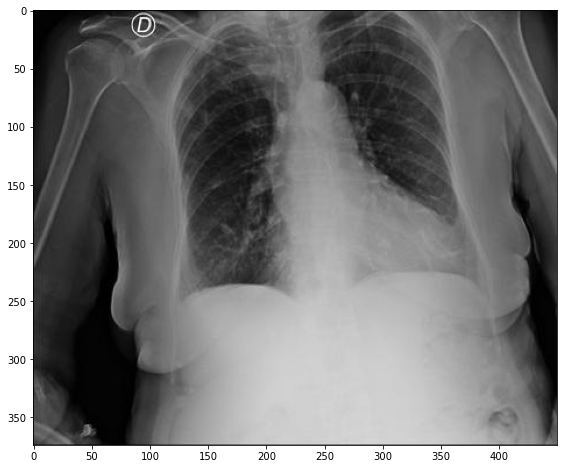

---------------------------------------------------------------


In [28]:
# datos de estudio a analizar

jpg_file_name = '6534a837497d.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)

# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REUCIA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = red_jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Box 0: x, y, w, h: 116, 102, 53, 104
Box 1: x, y, w, h: 330, 137, 53, 93
Tamaño de imagen: (376, 450, 3)
JPG reducido modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 65761e66de9f_red.jpg


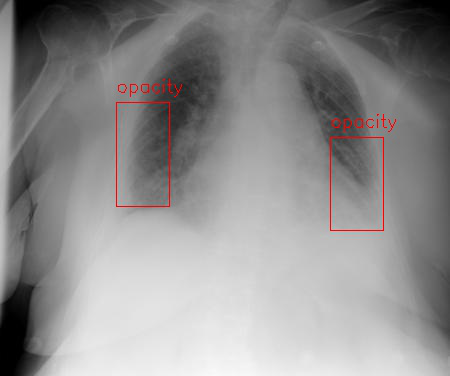

In [29]:
# datos de estudio a analizar

jpg_file_name = '65761e66de9f.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)

# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REUCIA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = red_jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Box 0: x, y, w, h: 720, 636, 332, 648
Box 1: x, y, w, h: 2044, 847, 329, 576
Tamaño de imagen: (2330, 2783, 3)
JPG original modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 65761e66de9f.jpg


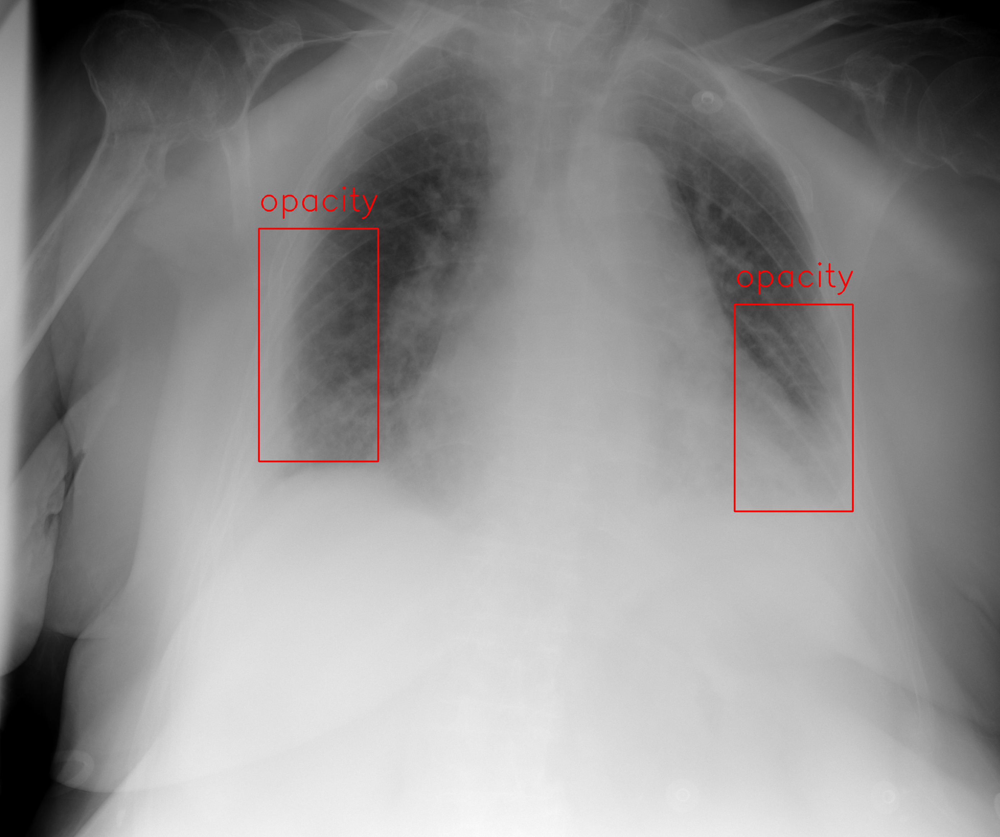

In [30]:
# datos de estudio a analizar

jpg_file_name = '65761e66de9f.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)

# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REUCIA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Imagen reducida correctamente.
Box 0: x, y, w, h: 320, 165, 63, 73
Box 1: x, y, w, h: 121, 195, 45, 58
Box 2: x, y, w, h: 124, 42, 29, 64
Tamaño de imagen: (374, 450, 3)
JPG reducido modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 74077a8e3b7c_red.jpg


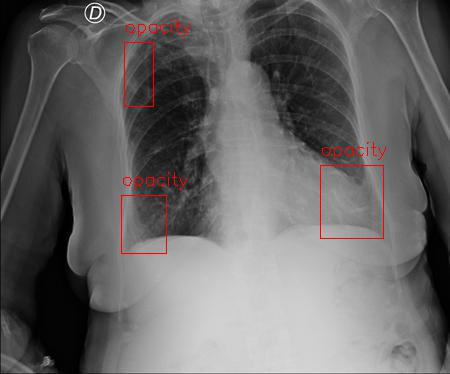

In [31]:
# datos de estudio a analizar

jpg_file_name = '74077a8e3b7c.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = dir,
                jpg_file_name = jpg_file_name,
                output_basewidth = 450,
                output_subfix = red_subfix,
                return_jpg_red = False)

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)
# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REDUCIDA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = red_jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

Imagen reducida correctamente.
Box 0: x, y, w, h: 2175, 1123, 432, 500
Box 1: x, y, w, h: 823, 1324, 306, 394
Box 2: x, y, w, h: 845, 291, 201, 437
Tamaño de imagen: (2544, 3056, 3)
JPG original modificado.
Ruta de imagen: ./data/examples/train_jpg/
ID estudio: 74077a8e3b7c.jpg


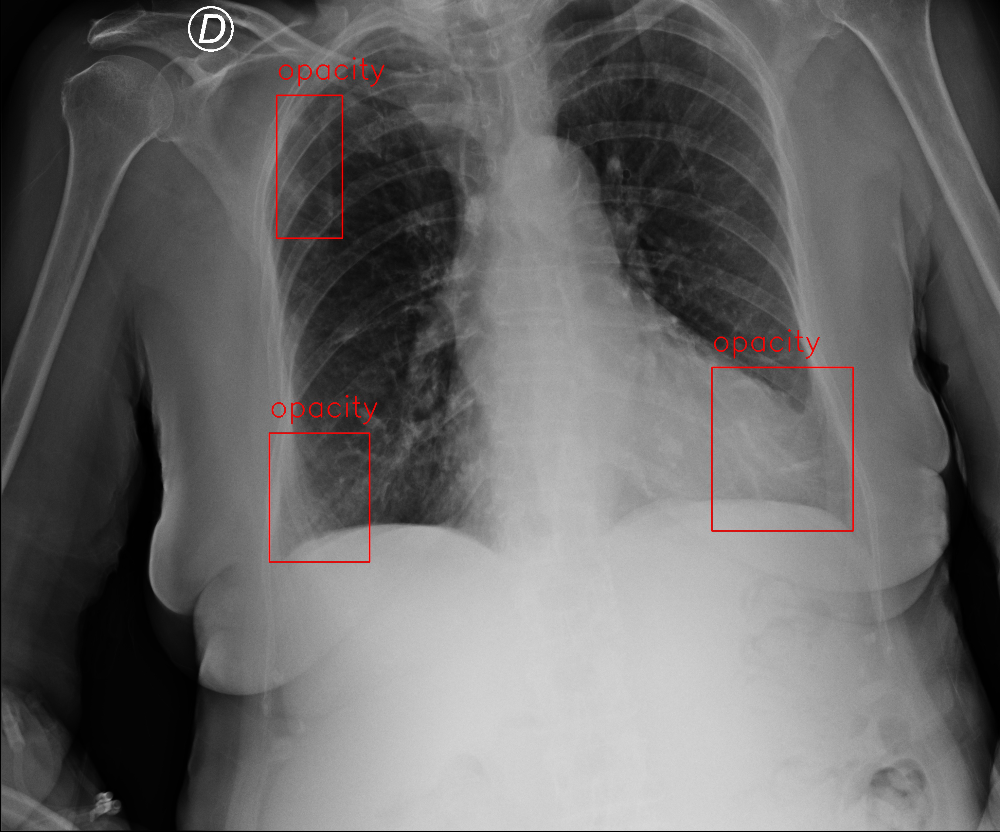

In [32]:
# datos de estudio a analizar

jpg_file_name = '74077a8e3b7c.jpg'

red_subfix = '_red'

red_jpg_file_name = jpg_file_name.replace('.jpg', red_subfix+'.jpg')

dir = './data/examples/train_jpg/'

# reducimos una imagen JPG y pasamos a escala de grises
reduce_jpg(dir = dir,
                jpg_file_name = jpg_file_name,
                output_basewidth = 450,
                output_subfix = red_subfix,
                return_jpg_red = False)

# cargamos imagen original y reducida de un estudio en JPG
jpgs = open_jpgs(jpg_file_name = jpg_file_name,
                red_jpg_file_name = red_jpg_file_name,
                dir = dir)
# almacenamos imagen ORIGINAL
jpg = jpgs[1]

# almacenamos imagen REDUCIDA
jpg_red = jpgs[3]

# calculo de relacion entre imagen original y la escalada
scale = jpg_red.size[0]/jpg.size[0]

# muestra resultado
#print('Ruta completa de imagen original:', jpgs[0])
#print('Ruta completa de imagen reucida:', jpgs[2])
#print(' El porcentaje de escalado es aproximadamente:', round(scale,3)*100)

# visualizamos dataframe con recuadros con diagnóstico
vis_diag_box(jpg_file_name)

# visualizamos JPG REDUCIDO con recuadros con diagnóstico
vis_diag_jpg(file_name = jpg_file_name,
                scale = scale,
                red_subfix = '_red',
                dir = dir)

### Conclusion de análisis simultaneo de imágenes y dataframes

Vemos que la información dada en los dataframes nos ayudaría a mejorar la predicción dado que nos podríamos enfocar en estas áreas. Por el momento no exploraremos esta información con el propósito de poner un modelo inicial en producción.

---
# Preparación de datos 1

### Conversión de `dcm` en `.\data\train` a `jpg` en `.\data\train_jpg`

In [ ]:
# definimos carpeta de destino `train_jpg`
train_jpg_folder_path = "./data/train_jpg/"
if not os.path.exists(train_jpg_folder_path):
    os.makedirs(train_jpg_folder_path)

# creacion de contadores
count_total = 0 # count total number of files
count_new = 0 # count of new files
# bucle para covertir archivos
for row_index, image_name in df_train[['image_name_jpg']].iterrows(): # row_index: observation index, image_name: observation image name
    is_image_name_aux = df_train['image_name_jpg']==image_name[0] # is_image_name: image_name without extension
    dcm_full_dir_aux = df_train[is_image_name_aux]['full_dir'].item() # directory of original DCM file
    jpg_full_dir_aux = train_jpg_folder_path+df_train[is_image_name_aux]['image_name_jpg'].item() # directory of output JPG file
    count_total += 1
    if not os.path.exists(jpg_full_dir_aux): # Actions if JPG file does not exist
        count_new += 1
        ds_aux = dicom.dcmread(dcm_full_dir_aux) # read DCM file
        pixel_array_numpy_aux = ds_aux.pixel_array # calculate pixel array
        scaled_img_aux = cv2.convertScaleAbs(pixel_array_numpy_aux-np.min(pixel_array_numpy_aux), alpha=(255.0 / min(np.max(pixel_array_numpy_aux)-np.min(pixel_array_numpy_aux), 10000))) # scaling of image
        cv2.imwrite(jpg_full_dir_aux, scaled_img_aux) # save new scaled JPG file

# muestra resultados
print('Directorio JPG train folder contiene {} imágenes.'.format(count_total))
print('{} imágenes fueron creadas.'.format(count_new))

### Conversión de `dcm` en `.\data\test` a `jpg` en `.\data\test_jpg`

In [439]:
### Pending...

### Conclusión de preparación de datos 1

En esta sección comenzamos creando una carpeta `train_jpg` para almacenar los datos de entrenamiento. Luego utilizamos un bucle para convertir cada imagenes `DCM` del dataframe de entrenamiento `X_train` desde la carpeta `train` a una imagen `JPG` en la carpeta de destino.

---
# GPU

In [33]:
# cargamos librerías para modelo
import tensorflow as tf
from tensorflow.keras import layers

# utilizamos GPU con TensorFlow/Keras
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

# mostramos GPU disponible
print("Num GPUs Available: ", len(physical_devices))

Num GPUs Available:  1


---
# Modelo 1: Image Data Generator

## Preprocesado

In [ ]:
# muestra dataframe con datos de entrenamiento
df_train[:5]

In [ ]:
# pandas dataframe
X_train_model_1 = df_train[['image_name_jpg','diagnostic_cat']].copy()

# directorio que contine las imágenes
directory = train_jpg_folder_path

# columna del dataframe que contiene el nombre de las imágenes
x_col = 'image_name_jpg'

# columna del dataframe que contiene la clasificación de las imágenes
y_col = 'diagnostic_cat'

# tramaño final de imágenes a reducir por el Image Data Generator
n_max_pixel = 64

# colores finales de las imágenes a reducir por el Image Data Generator
color_mode = 'grayscale'

# tamaño de batches de data
batch_size = 500

# reescalado de imágenes a reducir por el Image Data Generator 
rescale=1./255

# train/validation split de imágenes a reducir por el Image Data Generator
validation_split=0.25

In [ ]:
# creacion del Image Data Generator genérico
data_generator = ImageDataGenerator(rescale = rescale,
                                    validation_split = validation_split)

# creacion del Image Data Generator para datos de training
train_generator = data_generator.flow_from_dataframe(dataframe = X_train_model_1,
                                                        directory = directory, 
                                                        x_col =  x_col,
                                                        y_col = y_col,
                                                        subset = 'training',
                                                        batch_size = batch_size,
                                                        seed = 123,
                                                        shuffle = True,
                                                        class_mode = 'categorical',
                                                        target_size = (n_max_pixel, n_max_pixel), 
                                                        color_mode = color_mode
                                                        )

# creacion del Image Data Generator para datos de validación
val_generator = data_generator.flow_from_dataframe(dataframe = X_train_model_1,
                                                        directory = directory, 
                                                        x_col =  x_col,
                                                        y_col = y_col,
                                                        subset = 'validation',
                                                        batch_size = batch_size,
                                                        seed = 123,
                                                        shuffle = True,
                                                        class_mode = 'categorical',
                                                        target_size = (n_max_pixel, n_max_pixel), 
                                                        color_mode = color_mode
                                                        )

Found 4751 validated image filenames belonging to 4 classes.
Found 1583 validated image filenames belonging to 4 classes.


## Modelo

In [440]:
# argumentos para capa inicial de modelo
input_shape = (n_max_pixel, n_max_pixel, 1)

# modelo CCN
model_1 = Sequential([
        Dense(32, input_shape=input_shape),
        Activation('relu'),
        Dense(64),
        Activation('relu'),
        Flatten(),
        Dense(128),
        Activation('relu'),
        Dropout(0.5),
        Dense(4),
        Activation('softmax')
        ])

# compilación de modelo
model_1.compile(optimizers.RMSprop(learning_rate=0.001, decay=1e-6),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

In [ ]:
# muestra modelo creado
model_1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 64, 64, 32)        64        
_________________________________________________________________
activation (Activation)      (None, 64, 64, 32)        0         
_________________________________________________________________
dense_1 (Dense)              (None, 64, 64, 64)        2112      
_________________________________________________________________
activation_1 (Activation)    (None, 64, 64, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 262144)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               33554560  
_________________________________________________________________
activation_2 (Activation)    (None, 128)               0

In [ ]:
# argumentos para entrenamiento de modelo
step_size_train = train_generator.n//train_generator.batch_size
step_size_val  = val_generator.n//val_generator.batch_size

In [ ]:
# entrenamiento de modelo
history = model_1.fit(x = train_generator,
                        steps_per_epoch = step_size_train,
                        validation_data = val_generator,
                        validation_steps = step_size_val,
                        epochs=10
)

Epoch 1/10
9/9 [==============================] - 301s 36s/step - loss: 23.7294 - accuracy: 0.3540 - val_loss: 7.3907 - val_accuracy: 0.2780
Epoch 2/10
9/9 [==============================] - 275s 31s/step - loss: 4.7998 - accuracy: 0.3376 - val_loss: 1.7224 - val_accuracy: 0.4700
Epoch 3/10
9/9 [==============================] - 274s 31s/step - loss: 1.4202 - accuracy: 0.4361 - val_loss: 1.3205 - val_accuracy: 0.4713
Epoch 4/10
9/9 [==============================] - 273s 33s/step - loss: 1.3894 - accuracy: 0.4063 - val_loss: 1.3618 - val_accuracy: 0.4660
Epoch 5/10
9/9 [==============================] - 274s 31s/step - loss: 1.3862 - accuracy: 0.4731 - val_loss: 1.3683 - val_accuracy: 0.4633
Epoch 6/10
9/9 [==============================] - 274s 31s/step - loss: 1.3821 - accuracy: 0.4495 - val_loss: 1.3716 - val_accuracy: 0.4740
Epoch 7/10
9/9 [==============================] - 275s 31s/step - loss: 1.3590 - accuracy: 0.4787 - val_loss: 1.3287 - val_accuracy: 0.4707
Epoch 8/10
9/9 [===

In [ ]:
# definimos ubicacion para guardar modelo
model_dir = "./models/"

# creamos carpeta si no existe
if not os.path.exists(model_dir):
    os.makedirs(model_dir)

# guardamos el modelo en formato HDF5
model_1.save('./models/model_1_img_data_gen.h5')

In [ ]:
# cargamos modelo
#model_1 = load_model('./models/model_1_img_data_gen.h5')

## Evaluación

In [ ]:
# comprobamos accuracy de modelo basandonos en los datos de validation
model_1.evaluate(x = val_generator, steps = step_size_val)

3/3 [==============================] - 68s 23s/step - loss: 1.3019 - accuracy: 0.4720


[1.3019365072250366, 0.47200000286102295]

In [ ]:
# almacenamos histórico de accuracy y losses
tf_acc = history.history['accuracy']
tf_val_acc = history.history['val_accuracy']
tf_loss = history.history['loss']
tf_val_loss = history.history['val_loss']

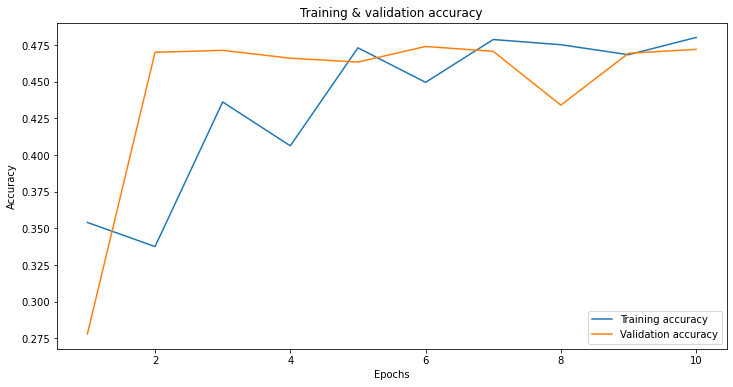

In [ ]:
# definimos cantidad de epochs 
tf_epochs = range(1, len(tf_acc) + 1)

# parámetros de gráfico
plt.figure(figsize=(12, 6))

# plot de accuracy de entrenamiento
plt.plot(tf_epochs, tf_acc, label='Training accuracy')

# plot de accuracy de test
plt.plot(tf_epochs, tf_val_acc, label='Validation accuracy')

# visualización
plt.title('Training & validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

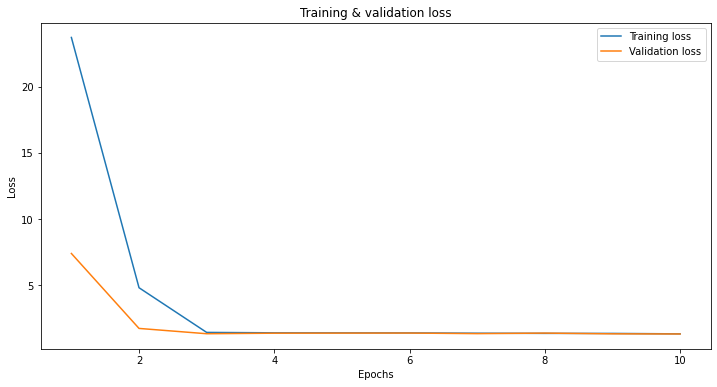

In [ ]:
# parámetros de gráfico
plt.figure(figsize=(12, 6))

# plot de loss de entrenamiento
plt.plot(tf_epochs, tf_loss, label='Training loss')

# plot de loss de test
plt.plot(tf_epochs, tf_val_loss, label='Validation loss')

# visualización
plt.title('Training & validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# cálculo de predicciones
y_pred = model_1.predict(val_generator)

In [ ]:
# muestra resultados de datos de validación
val_generator.classes[:10]

[3, 0, 2, 2, 0, 2, 2, 1, 1, 3]

In [ ]:
# cálculo de predicciones
y_pred = model_1.predict(val_generator)

# muestra predicciones de datos de validación
df_pred = pd.DataFrame(y_pred)
df_pred[:10]

,0,1,2,3
0,0.211452,0.225948,0.247834,0.314766
1,0.208126,0.223831,0.245425,0.322617
2,0.230347,0.237201,0.260705,0.271747
3,0.214088,0.227598,0.249713,0.308600
4,0.229903,0.236952,0.260419,0.272726
5,0.211775,0.226152,0.248066,0.314007
6,0.201924,0.219776,0.240821,0.337479
7,0.209907,0.224970,0.246720,0.318403
8,0.213891,0.227475,0.249574,0.309059
9,0.214429,0.227809,0.249954,0.307808


In [ ]:
# muestra predicciones de datos de validación (mayor probabilidad)
df_pred.idxmax(axis=1)

0       3
1       3
2       3
3       3
4       3
       ..
1578    3
1579    3
1580    3
1581    3
1582    3
Length: 1583, dtype: int64

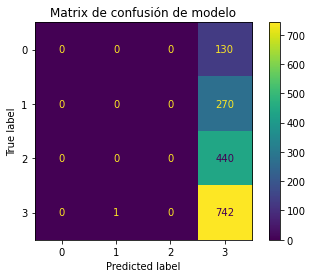

Reporte de clasificación de modelo <tensorflow.python.keras.engine.sequential.Sequential object at 0x00000175821653A0>:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       130
           1       0.00      0.00      0.00       270
           2       0.00      0.00      0.00       440
           3       0.47      1.00      0.64       743

    accuracy                           0.47      1583
   macro avg       0.12      0.25      0.16      1583
weighted avg       0.22      0.47      0.30      1583




C:\Programs\anaconda3\envs\tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Programs\anaconda3\envs\tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Programs\anaconda3\envs\tfm_env\lib\site-packages\sklearn\metrics\_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# creamos matriz de confusion
conf_mat = confusion_matrix(val_generator.classes, df_pred.idxmax(axis=1))

# mostramos matriz de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat)
disp.plot()
plt.title('Matrix de confusión de modelo')
plt.show()

# muestra reporte de modelo de clasificación supervisado
print(f"Reporte de clasificación de modelo {model}:\n"
        f"{classification_report(val_generator.classes, df_pred.idxmax(axis=1))}\n")

## Conclusion de modelo

Las características del modelo de redes neuronales que crearemos son las siguientes:

- Capas de redes neuronales: Utilizaremos layers con el objetivo de intentar conseguir un modelo inicial. Por ejemplo utilizando `Dense` layers (conexión profunda), `flatten` layers para preservar el orden de los weights y `dropout` layers para evitar overfitting. También utilizaremos como función de activación la `ReLu`. La última layer debe ser de múltiple clasificación por lo que utilizamos la función de activación `softmax`.

- Función de costes: Se selecciona `Multi-Label Cross Entropy` como loss function a utilizar considerando que estamos ante un problema de clasificación múltiple. 

- Optimizador: Se selecciona `RMSprop` como optimizador. La tasa de aprendizaje o `learning rate` utilizado es considerablemente bajo para obtener los mínimos valores de la loss function. Esto no es un problema para este caso ya que no es necesario que el aprendizaje del modelo tarde algunas horas.

Dividimos el total de la imágenes en un 75% para `entrenamiento` y el restante 25% para `validación`. El accuracy del modelo secuencial inicial creado es aproximadamente 50 %.

---
# Preparación de datos 2

## Comparación de imágenes individuales

In [34]:
# creamos función de preparación de imágenes
def image_prep(dir = './data/examples/train_jpg/',
                img = '6534a837497d_red.jpg',
                width = 450,
                height = 375):
    """Función para cargar una imágen y prepararla para comparación.

    Args:
        dir (str, optional): ruta a ubicació de archivo de imagen JPG.. Defaults to './data/examples/train_jpg/'.
        img (str, optional): nombre de archivo con extensión.. Defaults to '6534a837497d_red.jpg'.
        width (int, optional): ancho de la imágen preparada.. Defaults to 450.
        height (int, optional): alto de la imágen preparada.. Defaults to 375.

    Returns:
        [cv2 image]: imagen CV2 en escala de grises y con tamaño ajustado.
    """
    
    # cargamos la imagen
    img_full_dir = dir+img
    img = cv2.imread(img_full_dir)
    
    # transformamos a escala de grises
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # convertimos las dimensiones de la imagen
    img = cv2.resize(img, (width, height), interpolation = cv2.INTER_AREA)
    
    return img

In [35]:
# creamos función de cálculo de de MSE entre 2 imágenes
def mse_calc(imageA,
        imageB):
	"""Función que calcula el error cuadrático medio (Mean Squared Error) entre 2 imágenes. Esto es la suma del cuadrado de las diferencias entre las 2 imágenes.
	Las imágenes deben tener la misma dimensión.

	Args:
		imageA ([cv2_image]): Imágen 1 a comparar.
		imageB ([cv2_image]): Imágen 2 a comparar.

	Returns:
		[num]: MSE. Mientras más bajo el error, más similares son las imágenes entre si.
	"""
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])
	
	return err

In [36]:
# creamos función de comparación entre imágenes
def compare_images(imageA,
                    imageB,
                    show_images = False):
	"""Función para comparar imágenes por medio del error cuadrático medio y el índice de similaridad de estructura.

	Args:
		imageA ([cv2 image]): imagen original a comparar.
		imageB ([cv2 image]): imagen 2 a comparar.
		show_images (bool, optional): True: muestra imágenes. Defaults to False.
	"""
    # cálculo de errores y similitud entre imágenes
	mse_value = mse_calc(imageA, imageB).round(4)
	ssim_value = ssim(imageA, imageB).round(4)
	if show_images == True:
		# seteo de figura
		fig = plt.figure(figsize=(10,4))
		fig.suptitle('Comparación de imágenes')
		plt.title("MSE: %.2f - SSIM: %.2f" % (mse_value, ssim_value))
		plt.axis('off')
		# muestra 1ra imagen
		ax = fig.add_subplot(1, 2, 1)
		plt.imshow(imageA, cmap = plt.cm.gray, aspect='auto')
		plt.axis("off")
		# muestra 2da imagen
		ax = fig.add_subplot(1, 2, 2)
		plt.imshow(imageB, cmap = plt.cm.gray, aspect='auto')
		plt.axis("off")
		# show the images
		plt.show()
	
	return mse_value, ssim_value

In [37]:
img_original = image_prep(dir = './data/examples/train_jpg/',
                img = '6534a837497d_red.jpg',
                width = 450,
                height = 375)

img_to_comp = image_prep(dir = './data/examples/train_jpg/',
                img = '65761e66de9f_red.jpg',
                width = 450,
                height = 375)

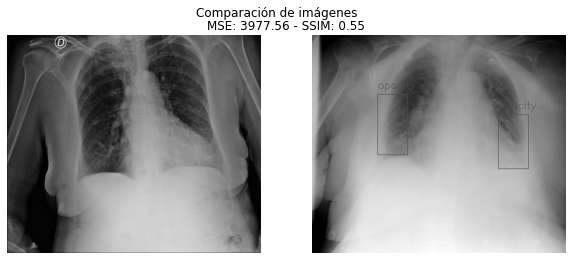

(3977.556, 0.5544)

In [38]:
# comparamos imágenes
compare_images(img_original, img_to_comp, show_images= True)

In [39]:
# comparamos imágenes
print('La diferencia con la imagen original en porcentaje es aprox.:', compare_images(img_original, img_to_comp, show_images= False)[1]*100)


La diferencia con la imagen original en porcentaje es aprox.: 55.44


## Comparación de imágenes en directorio

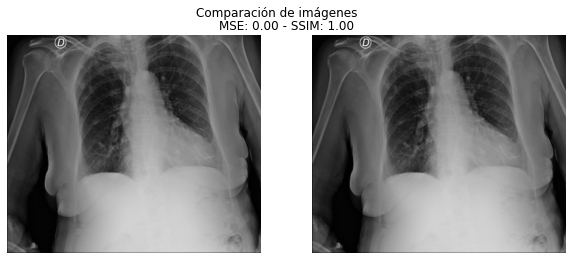

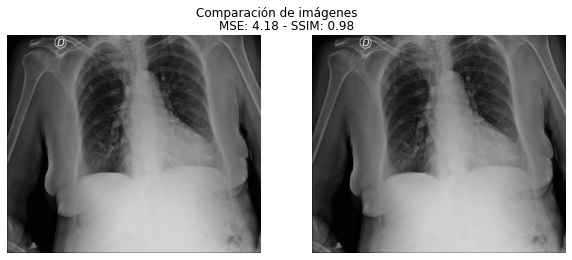

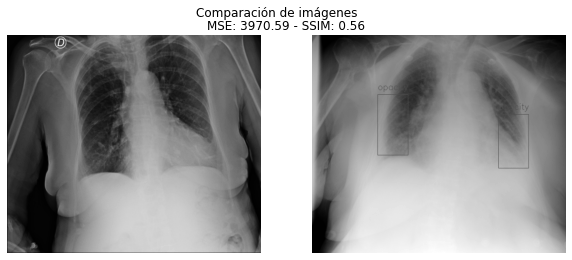

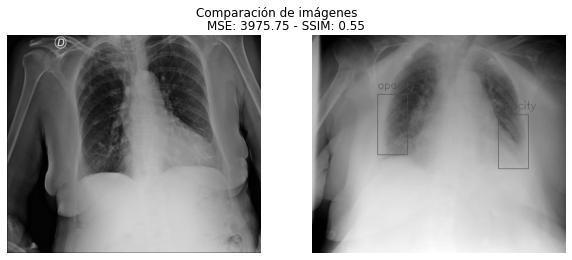

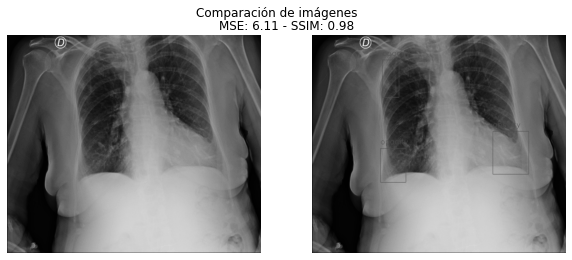

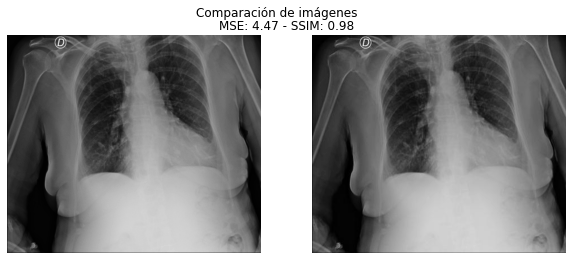

In [40]:
# datos de imagen original a comparar
dir = './data/examples/train_jpg/'
template = '6534a837497d.jpg'
width = 450
height = 375

# cargamos imagen
img_original = image_prep(dir = dir,
                img = template,
                width = width,
                height = height)

# creacion de contadores
count_total = 0 # count total number of files

# bucle de comparación
for root, directories, files in os.walk(dir, topdown=False):
    for name in files:
        img_to_comp = image_prep(dir = dir,
                                    img = name,
                                    width = width,
                                    height = height)
        compare_images(img_original, img_to_comp, show_images= True)

In [41]:
# datos de imagen original a comparar
dir = './data/train_jpg/'
template = '000a312787f2.jpg'
width = 450
height = 375

# cargamos imagen
img_original = image_prep(dir = dir,
                img = template,
                width = width,
                height = height)

# creacion de contadores
count_total = 0 # count total number of files

# bucle de comparación de template con estudios del dataframe
for row_index, image_name in df_train[['image_name_jpg']].iterrows(): # row_index: observation index, image_name: observation image name
    img_to_comp = image_prep(dir = dir,
                                img = image_name[0],
                                width = width,
                                height = height)
    df_train.loc[df_train['image_name_jpg']==image_name[0],['comparison']] = compare_images(img_original,
                                                                                                    img_to_comp,
                                                                                                    show_images= False)[1]
    count_total += 1

# muestra resultados
print('Directorio JPG train folder contiene {} imágenes que fueron comparadas.'.format(count_total))

Directorio JPG train folder contiene 6334 imágenes que fueron comparadas.


In [42]:
df_train.iloc[:5]

,study_dir,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat,image_name_jpg,comparison
0,00086460a852,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical,65761e66de9f.jpg,0.5709
1,000c9c05fd14,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical,51759b5579bc.jpg,0.4531
2,00292f8c37bd,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia,f6293b1c49e2.jpg,0.4507
3,005057b3f880,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia,3019399c31f4.jpg,0.2650
4,0051d9b12e72,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical,bb4b1da810f3.jpg,0.3243


In [43]:
df_train.describe()

,comparison
count,6334.000000
mean,0.445951
std,0.078096
min,0.120600
25%,0.399200
50%,0.462750
75%,0.505800
max,1.000000


## Conclusion de preparación de datos 2

---
# Exportamos dataframe para visualización

In [44]:
# exportamos el csv creado
df_train.to_csv('./csv/df_train.csv')

---
# Modelo 2: Improved ImageDataGenerator

In [45]:
# Pending...

---
# Modelo 3: Bounding Boxes Data Augmentation

## Preparación de `model_2_X_train`

In [46]:
# mostramos dataframe de entrenamiento
df_train.iloc[:5]

,study_dir,full_dir,boxes,label,StudyInstanceUID,diagnostic_cat,image_name_jpg,comparison
0,00086460a852,./data/train/00086460a852/9e8302230c91/65761e6...,"[{'x': 720.65215, 'y': 636.51048, 'width': 332...",opacity 1 720.65215 636.51048 1052.84563 1284....,00086460a852,typical,65761e66de9f.jpg,0.5709
1,000c9c05fd14,./data/train/000c9c05fd14/e555410bd2cd/51759b5...,NaN,none 1 0 0 1 1,000c9c05fd14,atypical,51759b5579bc.jpg,0.4531
2,00292f8c37bd,./data/train/00292f8c37bd/73120b4a13cb/f6293b1...,NaN,none 1 0 0 1 1,00292f8c37bd,neg_for_pneumonia,f6293b1c49e2.jpg,0.4507
3,005057b3f880,./data/train/005057b3f880/e34afce999c5/3019399...,NaN,none 1 0 0 1 1,005057b3f880,neg_for_pneumonia,3019399c31f4.jpg,0.2650
4,0051d9b12e72,./data/train/0051d9b12e72/152f6ec68d86/bb4b1da...,"[{'x': 812.54698, 'y': 1376.41291, 'width': 62...",opacity 1 812.54698 1376.41291 1435.14793 1806...,0051d9b12e72,atypical,bb4b1da810f3.jpg,0.3243


In [47]:
# mostramos un estudio
df_train.iloc[0]

study_dir                                                00086460a852
full_dir            ./data/train/00086460a852/9e8302230c91/65761e6...
boxes               [{'x': 720.65215, 'y': 636.51048, 'width': 332...
label               opacity 1 720.65215 636.51048 1052.84563 1284....
StudyInstanceUID                                         00086460a852
diagnostic_cat                                                typical
image_name_jpg                                       65761e66de9f.jpg
comparison                                                     0.5709
Name: 0, dtype: object

In [48]:
# mostramos datos de estudio específico
df_train.iloc[0]['boxes']

"[{'x': 720.65215, 'y': 636.51048, 'width': 332.19348, 'height': 648.12561}, {'x': 2044.77989, 'y': 847.90622, 'width': 329.87049, 'height': 576.11169}]"

In [49]:
# mostramos datos de estudio específico
df_train.iloc[0]['label']

'opacity 1 720.65215 636.51048 1052.84563 1284.63609 opacity 1 2044.77989 847.90622 2374.65038 1424.01791'

In [50]:
# transformamos strings (no NaN) a listas para parseo de datos
df_train.loc[df_train['boxes'].isna()==False, 'boxes'] = df_train.loc[df_train['boxes'].isna()==False, 'boxes'].apply(eval)

In [51]:
# creamos dataframe con datos de bounding boxes parseados agrupados por estudio
model_2_X_train = df_train.loc[df_train['boxes'].isna()==False].groupby(['image_name_jpg', 'diagnostic_cat'])['boxes'].apply(lambda x: pd.DataFrame(x.values[0])).reset_index()

# renombramos columnas
model_2_X_train = model_2_X_train.rename(columns = {'image_name_jpg': 'filename',
                                                    'diagnostic_cat': 'class',
                                                    'x': 'xmin',
                                                    'y': 'ymin'})

# creamos nuevas columnas de bounding box
model_2_X_train['xmax'] = model_2_X_train['xmin']+model_2_X_train['width'] 
model_2_X_train['ymax'] = model_2_X_train['ymin']+model_2_X_train['height'] 

# quitamos columnas redundantes
model_2_X_train = model_2_X_train.drop(columns=['level_2', 'width', 'height'])

# mostramos resultados
model_2_X_train[:5]

,filename,class,xmin,ymin,xmax,ymax
0,000a312787f2.jpg,typical,789.28836,582.43035,1815.94498,2499.73327
1,000a312787f2.jpg,typical,2245.91208,591.20528,3340.57370,2352.75472
2,0012ff7358bc.jpg,typical,677.42216,197.97662,1545.21983,1197.75876
3,0012ff7358bc.jpg,typical,1792.69064,402.55250,2409.71798,1606.91050
4,001398f4ff4f.jpg,atypical,2729.00000,2181.33331,3677.00012,2785.33331


In [83]:
model_2_X_train.loc[model_2_X_train['filename']=='000a312787f2.jpg', ['class']]

,class
0,typical
1,typical


In [86]:
# definimos directorio de imágenes a analizar
dir = './data/train_jpg/' #train_jpg_folder_path

# creamos variables auxiliares
count_total = 0
model_2_X_train['width'] = 0
model_2_X_train['height'] = 0

# bucle para tomar información de ancho y alto de cada imagen
for root, directories, files in os.walk(dir, topdown=False):
    for name in files:
        img_full_dir = dir+str(name)
        img = cv2.imread(img_full_dir, 0)
        model_2_X_train.loc[model_2_X_train['filename']==name, ['width']] = img.shape[1]
        model_2_X_train.loc[model_2_X_train['filename']==name, ['height']] = img.shape[0]
        count_total += 1

In [87]:
# muestra resultados
model_2_X_train[:5]

,filename,class,xmin,ymin,xmax,ymax,width,height
0,000a312787f2.jpg,typical,789.28836,582.43035,1815.94498,2499.73327,4256,3488
1,000a312787f2.jpg,typical,2245.91208,591.20528,3340.57370,2352.75472,4256,3488
2,0012ff7358bc.jpg,typical,677.42216,197.97662,1545.21983,1197.75876,3056,2544
3,0012ff7358bc.jpg,typical,1792.69064,402.55250,2409.71798,1606.91050,3056,2544
4,001398f4ff4f.jpg,atypical,2729.00000,2181.33331,3677.00012,2785.33331,4280,3520


## Preprocesado de imágenes

In [88]:
height_resize = iaa.Sequential([ 
    iaa.Resize({"height": 600, "width": 'keep-aspect-ratio'})
])
width_resize = iaa.Sequential([ 
    iaa.Resize({"height": 'keep-aspect-ratio', "width": 600})
])

In [89]:
# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

In [90]:
def resize_imgaug(df, images_path, aug_images_path, image_prefix):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                                ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                                )
    grouped = df.groupby('filename')    
    
    for filename in df['filename'].unique():
    #   Get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)
        
    #   The only difference between if and elif statements below is the use of height_resize and width_resize augmentors
    #   deffined previously.

    #   If image height is greater than or equal to image width 
    #   AND greater than 600px perform resizing augmentation shrinking image height to 600px.
        if group_df['height'].unique()[0] >= group_df['width'].unique()[0] and group_df['height'].unique()[0] > 600:
        #   read the image
            image = imageio.imread(images_path+filename)
        #   get bounding boxes coordinates and write into array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        #   pass the array of bounding boxes coordinates to the imgaug library
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        #   apply augmentation on image and on the bounding boxes
            image_aug, bbs_aug = height_resize(image=image, bounding_boxes=bbs)
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])
            
    #   if image width is greater than image height 
    #   AND greater than 600px perform resizing augmentation shrinking image width to 600px
        elif group_df['width'].unique()[0] > group_df['height'].unique()[0] and group_df['width'].unique()[0] > 600:
        #   read the image
            image = imageio.imread(images_path+filename)
        #   get bounding boxes coordinates and write into array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        #   pass the array of bounding boxes coordinates to the imgaug library
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        #   apply augmentation on image and on the bounding boxes
            image_aug, bbs_aug = width_resize(image=image, bounding_boxes=bbs)
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])

    #     append image info without any changes if it's height and width are both less than 600px 
        else:
            aug_bbs_xy = pd.concat([aug_bbs_xy, group_df])
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [95]:
# parámetros de función de preprocesado de imágenes
dir = './data/train_jpg/' #train_jpg_folder_path
aug_images_path =  './data/train_jpg_aug/'
image_prefix = 'aug_'

# preprocesado de imágenes
resized_images_df = resize_imgaug(df = model_2_X_train,
                                    images_path = dir,
                                    aug_images_path = aug_images_path,
                                    image_prefix = image_prefix)